In [175]:
import pandas as pd
import geopandas as gpd
import os
import zipfile
import requests
from io import BytesIO
import plotly.express as px
from dash import Dash, dcc, html, Input, Output

# -------------------------------------
# Load and clean crime data
# -------------------------------------
url = "https://data.kingcounty.gov/api/views/4kmt-kfqf/rows.csv?accessType=DOWNLOAD"
df = pd.read_csv(url, low_memory=False)
df["incident_datetime"] = pd.to_datetime(df["incident_datetime"], errors="coerce")

# Filter out anything before a reasonable threshold (e.g., Jan 2020)
df = df[df["incident_datetime"] >= pd.Timestamp("2020-01-01")]
df = df.dropna(subset=["zip", "nibrs_code_name", "incident_datetime", "city"])
df["zip"] = df["zip"].astype(str).str.zfill(5)
df["Month_Year"] = df["incident_datetime"].dt.to_period("M").astype(str)
df["hour"] = df["incident_datetime"].dt.hour


# -------------------------------------
# Load ZIP shapefile and filter to relevant ZIPs
# -------------------------------------

shapefile_url = "https://www2.census.gov/geo/tiger/GENZ2020/shp/cb_2020_us_zcta520_500k.zip"
shapefile_dir = "shapefiles"

# Download and extract if not already
if not os.path.exists(shapefile_dir):
    os.makedirs(shapefile_dir, exist_ok=True)
    r = requests.get(shapefile_url)
    z = zipfile.ZipFile(BytesIO(r.content))
    z.extractall(shapefile_dir)

# Load shapefile
zip_geo = gpd.read_file(os.path.join(shapefile_dir, "cb_2020_us_zcta520_500k.shp"))
zip_geo["zip"] = zip_geo["ZCTA5CE20"]
zip_geo = zip_geo[zip_geo["zip"].isin(df["zip"].unique())]

# -------------------------------------
# Prepare dropdown options
# -------------------------------------
month_options = sorted(df["Month_Year"].dropna().unique(), key=lambda x: pd.Period(x, freq='M'))
crime_options = sorted(df["nibrs_code_name"].unique())

# -------------------------------------
# Build Dash App
# -------------------------------------
app = Dash(__name__)
app.layout = html.Div([
    html.H2("King County Crime Map by ZIP Code"),

    html.Label("Select Crime Type:"),
    dcc.Dropdown(
        id="crime-dropdown",
        options=[{"label": crime, "value": crime} for crime in crime_options],
        value="LARCENY/THEFT"
    ),

    html.Label("Select Month-Year:"),
    dcc.Dropdown(
        id="month-dropdown",
        options=[{"label": m, "value": m} for m in month_options],
        value=month_options[0]
    ),

    dcc.Graph(id="zip-map"),

    html.H3("Monthly Trend for Selected Crime Type"),
    dcc.Graph(id="trend-line"),

    html.H3("Hourly Trend for Selected Crime Type"),
    dcc.Graph(id="hourly-line")
])



@app.callback(
    Output("zip-map", "figure"),
    Input("crime-dropdown", "value"),
    Input("month-dropdown", "value")
)
def update_map(selected_crime, selected_month):
    # Aggregate crime counts by ZIP
    agg = df[
        (df["nibrs_code_name"] == selected_crime) &
        (df["Month_Year"] == selected_month)
    ].groupby("zip").size().reset_index(name="count")

    # Merge with ZIP geometries
    merged = zip_geo.merge(agg, on="zip", how="left")
    merged["count"] = merged["count"].fillna(0)

    # Generate choropleth
    fig = px.choropleth_mapbox(
        merged,
        geojson=merged.geometry.__geo_interface__,
        locations=merged.index,
        color="count",
        hover_name="zip",
        hover_data={"count": True, "zip": True},
        mapbox_style="open-street-map",
        center={"lat": 47.5, "lon": -122.1},
        zoom=7,
        opacity=0.6,
        color_continuous_scale="Reds",
        height=600
    )
    fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0})
    fig.update_traces(marker_line_width=1.5, marker_line_color='black')
    return fig

@app.callback(
    Output("trend-line", "figure"),
    Input("crime-dropdown", "value")
)
def update_trend(selected_crime):
    trend = (
        df[df["nibrs_code_name"] == selected_crime]
        .groupby("Month_Year")
        .size()
        .reset_index(name="count")
        .sort_values("Month_Year")
    )

    fig = px.line(
        trend,
        x="Month_Year",
        y="count",
        title=f"Monthly Trend for {selected_crime}",
        markers=True
    )
    fig.update_layout(xaxis_title="Month", yaxis_title="Number of Incidents")
    return fig

@app.callback(
    Output("hourly-line", "figure"),
    Input("crime-dropdown", "value")
)
def update_hourly_trend(selected_crime):
    hourly = (
        df[df["nibrs_code_name"] == selected_crime]
        .groupby("hour")
        .size()
        .reset_index(name="count")
        .sort_values("hour")
    )

    fig = px.line(
        hourly,
        x="hour",
        y="count",
        title=f"Hourly Crime Pattern: {selected_crime}",
        markers=True
    )
    fig.update_layout(
        xaxis=dict(dtick=1, title="Hour of Day (0–23)"),
        yaxis_title="Number of Incidents"
    )
    return fig


if __name__ == "__main__":
    app.run_server(debug=True, port=8050)

/var/folders/jf/qg8srjzs7d9bg9npqyhh8x1c0000gn/T/ipykernel_99762/4199093752.py:15: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



In [176]:

# Select and deduplicate
zip_city_df = df[["zip", "city"]].drop_duplicates().sort_values(by="zip")

# Save to Excel
zip_city_df.to_excel("zip_city_pairs.xlsx", index=False)



/var/folders/jf/qg8srjzs7d9bg9npqyhh8x1c0000gn/T/ipykernel_99762/4093552919.py:7: UserWarning:

Pandas requires version '3.0.5' or newer of 'xlsxwriter' (version '3.0.3' currently installed).



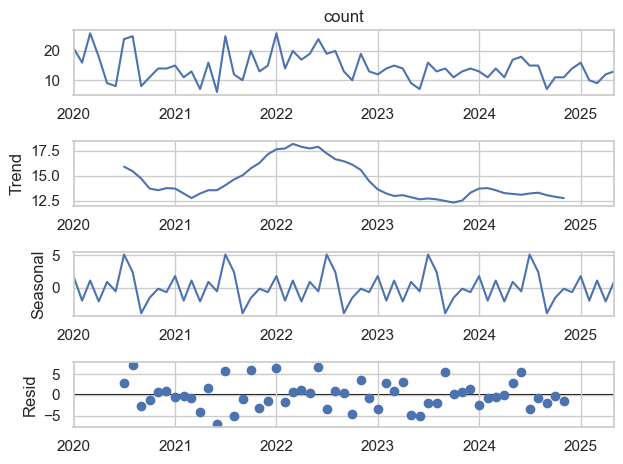

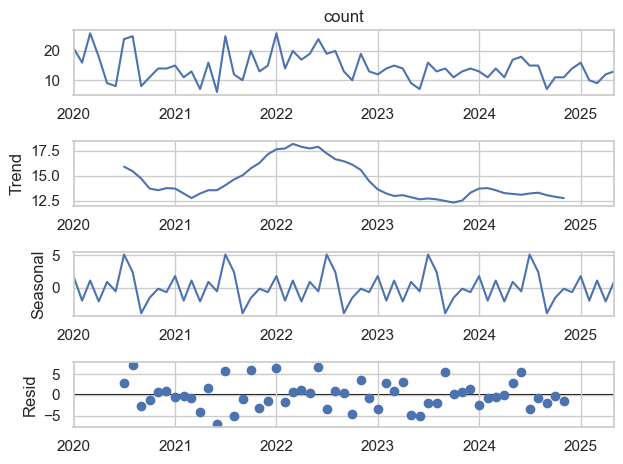

In [177]:
crime_trends = df.groupby(["Month_Year", "nibrs_code_name"]).size().reset_index(name="count")
crime_trends["Month_Year"] = pd.to_datetime(crime_trends["Month_Year"])

# Example: plot one crime type
import statsmodels.api as sm

series = crime_trends[crime_trends["nibrs_code_name"] == "Family Offenses, Nonviolent"]
series = series.set_index("Month_Year").resample("MS").sum()  # 'MS' = month start
series = series.asfreq("MS")  # Set the freq properly

decomposition = sm.tsa.seasonal_decompose(series["count"], model="additive")
decomposition.plot()




In [178]:


# Filter and group each crime type
family_hourly = (
    df[df["nibrs_code_name"] == "Family Offenses, Nonviolent"]
    .groupby("hour")
    .size()
    .reset_index(name="count")
)
family_hourly["crime"] = "Family Offenses, Nonviolent"

vehicle_hourly = (
    df[df["nibrs_code_name"] == "Motor Vehicle Theft"]
    .groupby("hour")
    .size()
    .reset_index(name="count")
)
vehicle_hourly["crime"] = "Motor Vehicle Theft"

shoplifting_hourly = (
    df[df["nibrs_code_name"] == "Shoplifting"]
    .groupby("hour")
    .size()
    .reset_index(name="count")
)
shoplifting_hourly["crime"] = "Shoplifting"

vandalism_hourly = (
    df[df["nibrs_code_name"] == "Destruction/Damage/Vandalism of Property"]
    .groupby("hour")
    .size()
    .reset_index(name="count")
)
vandalism_hourly["crime"] = "Destruction/Damage/Vandalism of Property"

# Combine all
combined_hourly = pd.concat([family_hourly, vehicle_hourly, shoplifting_hourly, vandalism_hourly])



In [179]:

import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Prepare data
def hourly_crime(crime_name):
    temp = (
        df[df["nibrs_code_name"] == crime_name]
        .groupby("hour")
        .size()
        .reset_index(name="count")
    )
    return temp

family = hourly_crime("Family Offenses, Nonviolent")
vehicle = hourly_crime("Motor Vehicle Theft")
shoplifting = hourly_crime("Shoplifting")
vandalism = hourly_crime("Destruction/Damage/Vandalism of Property")

# Create subplots
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        "🚔 Family Offenses, Nonviolent",
        "🚔 Motor Vehicle Theft",
        "🚔 Shoplifting",
        "🚔 Destruction/Damage/Vandalism of Property"
    ]
)

# Add traces
fig.add_trace(go.Scatter(x=family["hour"], y=family["count"], mode="lines+markers", name="Family"), row=1, col=1)
fig.add_trace(go.Scatter(x=vehicle["hour"], y=vehicle["count"], mode="lines+markers", name="Vehicle Theft"), row=1, col=2)
fig.add_trace(go.Scatter(x=shoplifting["hour"], y=shoplifting["count"], mode="lines+markers", name="Shoplifting"), row=2, col=1)
fig.add_trace(go.Scatter(x=vandalism["hour"], y=vandalism["count"], mode="lines+markers", name="Vandalism"), row=2, col=2)

# Layout
fig.update_layout(
    height=800,
    width=1000,
    title_text="Hourly Crime Patterns for Selected Types",
    showlegend=False
)

# Uniform x-axis
fig.update_xaxes(title_text="Hour (0–23)", dtick=1)
fig.update_yaxes(title_text="Number of Incidents")

fig.show()


In [180]:
#Hourly DUI Pattern – Key Observations
#Hour Range	Pattern	Interpretation / Insight
#9 PM – 3 AM	Steep rise, peaking at midnight & 2–3 AM	Core late-night drinking and post-bar driving window
#4 AM – 11 AM	Very low activity	Minimal traffic + fewer social events (morning recovery)
#12 PM – 5 PM	Slight pickup begins	Potential after-work socializing or early evening drinking
#6 PM – 9 PM	Rising trend begins again	Start of night-out hours
#11 PM – 2 AM	Peak intensity hours	This is the highest-risk DUI period by far

In [181]:
#Family offenses peak during midday and early evening

In [182]:

# Filter and group each crime type
family_monthly = (
    df[df["nibrs_code_name"] == "Family Offenses, Nonviolent"]
    .groupby("Month_Year")
    .size()
    .reset_index(name="count")
)
family_monthly["crime"] = "Family Offenses, Nonviolent"

vehicle_monthly = (
    df[df["nibrs_code_name"] == "Motor Vehicle Theft"]
    .groupby("Month_Year")
    .size()
    .reset_index(name="count")
)
vehicle_monthly["crime"] = "Motor Vehicle Theft"

shoplifting_monthly = (
    df[df["nibrs_code_name"] == "Shoplifting"]
    .groupby("Month_Year")
    .size()
    .reset_index(name="count")
)
shoplifting_monthly["crime"] = "Shoplifting"

vandalism_monthly = (
    df[df["nibrs_code_name"] == "Destruction/Damage/Vandalism of Property"]
    .groupby("Month_Year")
    .size()
    .reset_index(name="count")
)
vandalism_monthly["crime"] = "Destruction/Damage/Vandalism of Property"

# Combine all
combined_monthly = pd.concat([family_monthly, vehicle_monthly, shoplifting_monthly, vandalism_monthly])


In [183]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Prepare data
def monthly_crime(crime_name):
    temp = (
        df[df["nibrs_code_name"] == crime_name]
        .groupby("Month_Year")
        .size()
        .reset_index(name="count")
    )
    return temp

family = monthly_crime("Family Offenses, Nonviolent")
vehicle = monthly_crime("Motor Vehicle Theft")
shoplifting = monthly_crime("Shoplifting")
vandalism = monthly_crime("Destruction/Damage/Vandalism of Property")

# Create subplots
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        "🚔 Family Offenses, Nonviolent",
        "🚔 Motor Vehicle Theft",
        "🚔 Shoplifting",
        "🚔 Destruction/Damage/Vandalism of Property"
    ]
)

# Add traces
fig.add_trace(go.Scatter(x=family["Month_Year"], y=family["count"], mode="lines+markers", name="Family"), row=1, col=1)
fig.add_trace(go.Scatter(x=vehicle["Month_Year"], y=vehicle["count"], mode="lines+markers", name="Vehicle Theft"), row=1, col=2)
fig.add_trace(go.Scatter(x=shoplifting["Month_Year"], y=shoplifting["count"], mode="lines+markers", name="Shoplifting"), row=2, col=1)
fig.add_trace(go.Scatter(x=vandalism["Month_Year"], y=vandalism["count"], mode="lines+markers", name="Vandalism"), row=2, col=2)

# Get sorted list of all unique months
months = sorted(df["Month_Year"].unique())
every_3rd_month = months[::3]

fig.update_layout(
    height=800,
    width=1000,
    title_text="Monthly Crime Patterns for Selected Types",
    showlegend=False
)

fig.update_xaxes(
    title_text="Month",
    tickmode="array",
    tickvals=every_3rd_month
)

fig.update_yaxes(title_text="Number of Incidents")
fig.show()



In [184]:
#Arson: Long-term decline in arson since ~2022, Seasonal	Strong annual pattern with summer peaks
# Shoplifting: Sharp increase in shoplifting, especially post-2023,Seasonal	Predictable annual cycle with fall peaks
# DUI mONTHLY: DUI incidents declined through 2021 but increased sharply from 2023–2025, Seasonal	Summer months consistently see more DUI cases
#fAMILY OFFENSES/NONVIOLENT: 1. Trend Component:

#The trend rose from mid-2021 to mid-2022, peaking around late 2022.
#After that, there's a gradual decline continuing into 2025.
#Suggests a temporary surge in reported nonviolent family offenses (possibly COVID-era or post-pandemic stress factors).
#2. Seasonality Component:

#The seasonal pattern is present but weak, with small regular fluctuations.
#Peaks and troughs aren't strongly pronounced — meaning seasonal forces (holidays, school schedules, etc.) may play a limited role here.

In [185]:
#############VAR
# Count monthly crimes by type
crime_counts = df.groupby(["Month_Year", "nibrs_code_name"]).size().reset_index(name="count")

# Pivot to wide format (Month_Year × Crime Type)
crime_pivot = crime_counts.pivot(index="Month_Year", columns="nibrs_code_name", values="count").fillna(0)
crime_pivot.index = pd.to_datetime(crime_pivot.index)
crime_pivot = crime_pivot.sort_index()

# Identify top 5 crime types by total counts
top_crimes = crime_counts.groupby("nibrs_code_name")["count"].sum().nlargest(5).index

# Filter original df to include only top crimes
crime_ts = crime_counts[crime_counts["nibrs_code_name"].isin(top_crimes)]

# Pivot again for those top crimes only
crime_wide = crime_ts.pivot(index="Month_Year", columns="nibrs_code_name", values="count").fillna(0)
crime_wide.index = pd.to_datetime(crime_wide.index)
crime_wide = crime_wide.sort_index()

# Take first difference (stationarity)
crime_diff = crime_wide.diff().dropna()
top_crimes



Index(['Destruction/Damage/Vandalism of Property', 'Motor Vehicle Theft',
       'Theft From Motor Vehicle', 'All Other Offenses', 'All Other Larceny'],
      dtype='object', name='nibrs_code_name')

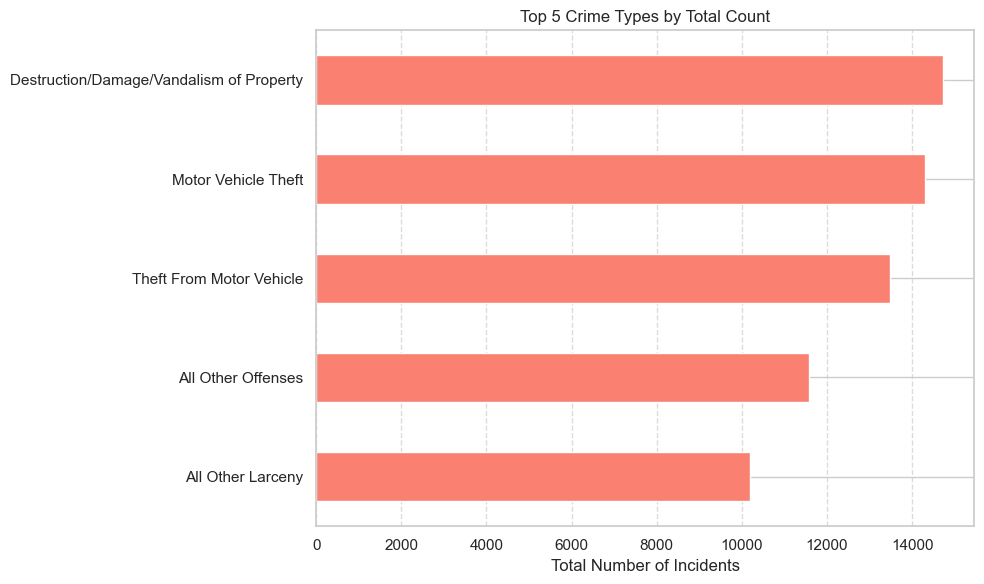

In [186]:

import matplotlib.pyplot as plt

# Assuming `df` is your original crime DataFrame

# Count monthly crimes by type
crime_counts = df.groupby(["Month_Year", "nibrs_code_name"]).size().reset_index(name="count")

# Total count per crime type
total_counts = crime_counts.groupby("nibrs_code_name")["count"].sum()

# Top 5 crimes by total count
top_crimes = total_counts.nlargest(5)

# Bar plot
plt.figure(figsize=(10, 6))
top_crimes.sort_values().plot(kind='barh', color='salmon')
plt.xlabel("Total Number of Incidents")
plt.ylabel("")  # Removes y-axis label
plt.title("Top 5 Crime Types by Total Count")
plt.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()


In [187]:
## top 5 crime types in Kng County: 'Destruction/Damage/Vandalism of Property', 'Motor Vehicle Theft','Theft From Motor Vehicle', 'All Other Offenses', 'All Other Larceny'


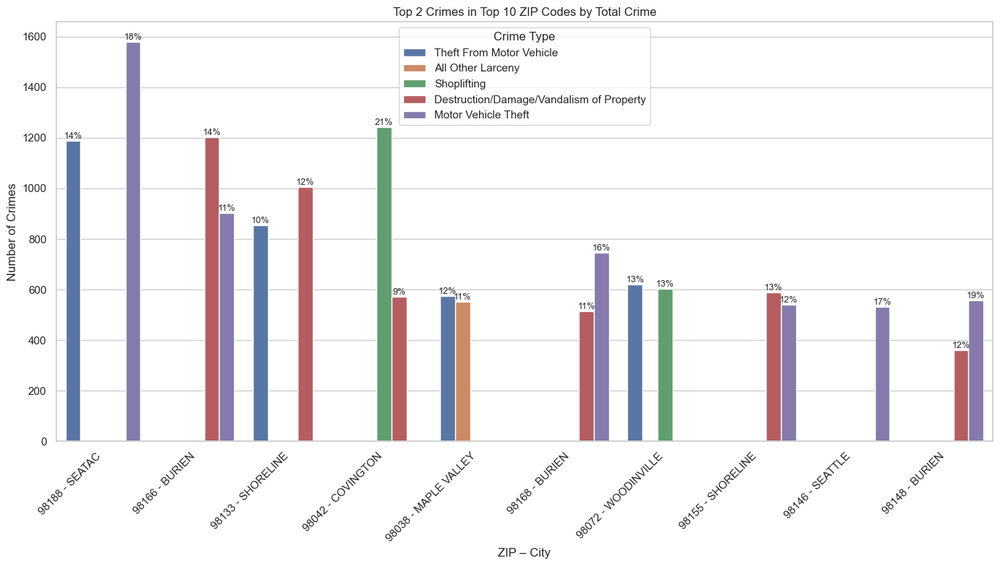

In [188]:

import matplotlib.pyplot as plt
import seaborn as sns

# Count crimes per ZIP
top_zips = (
    df.groupby(['zip', 'city'])
    .size()
    .reset_index(name='total_crimes')
    .sort_values('total_crimes', ascending=False)
    .head(10)
)

# Filter the original df to just those ZIPs
df_top_zips = df[df['zip'].isin(top_zips['zip'])]

# Count crimes by ZIP and type
crime_zip = (
    df_top_zips.groupby(['zip', 'city', 'nibrs_code_name'])
    .size()
    .reset_index(name='count')
)

# Get top 2 crime types per ZIP
top2_crimes_zip = (
    crime_zip.sort_values(['zip', 'count'], ascending=[True, False])
    .groupby(['zip'])
    .head(2)
)

# Merge total crimes for proportion
top2_crimes_zip = top2_crimes_zip.merge(top_zips, on=['zip', 'city'])
top2_crimes_zip['proportion'] = top2_crimes_zip['count'] / top2_crimes_zip['total_crimes']

# Create a combined label
top2_crimes_zip['zip_city'] = top2_crimes_zip['zip'] + " - " + top2_crimes_zip['city']

# Sort for plotting order
zip_order = (
    top2_crimes_zip.groupby('zip_city')['total_crimes']
    .max()
    .sort_values(ascending=False)
    .index
)

# Create proportion label map
prop_map = (
    top2_crimes_zip
    .set_index(['zip_city', 'nibrs_code_name'])['proportion']
    .apply(lambda x: f"{x:.0%}")
)

# Plot
plt.figure(figsize=(14, 8))
sns.set(style="whitegrid")
bar = sns.barplot(
    data=top2_crimes_zip,
    x='zip_city', y='count',
    hue='nibrs_code_name',
    order=zip_order
)

# Add percentage annotations
for container in bar.containers:
    labels = []
    for bar_patch in container:
        if bar_patch.get_height() == 0:
            labels.append("")
            continue
        
        # Determine zip_city using x-coordinate
        bar_x = bar_patch.get_x() + bar_patch.get_width() / 2
        xticks = bar.axes.get_xticks()
        xticklabels = [tick.get_text() for tick in bar.axes.get_xticklabels()]
        closest_index = min(range(len(xticks)), key=lambda i: abs(xticks[i] - bar_x))
        zip_city = xticklabels[closest_index]

        # Get crime type from legend label
        crime_type = container.get_label()

        # Fetch formatted percentage
        label = prop_map.get((zip_city, crime_type), "")
        labels.append(label)

    bar.bar_label(container, labels=labels, label_type='edge', fontsize=9)

# Final plot details
plt.title("Top 2 Crimes in Top 10 ZIP Codes by Total Crime")
plt.xlabel("ZIP – City")
plt.ylabel("Number of Crimes")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Crime Type")
plt.tight_layout()
plt.show()





In [189]:
from statsmodels.tsa.stattools import adfuller

# Check one column
result = adfuller(crime_pivot["Simple Assault"])
print("ADF Statistic:", result[0])
print("p-value:", result[1])


ADF Statistic: -1.539654015213133
p-value: 0.5138118932084973


In [190]:
from statsmodels.tsa.api import VAR

model = VAR(crime_diff)
results = model.fit(maxlags=4, ic='aic')  # use info criteria to choose lags
print(results.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 30, May, 2025
Time:                     14:41:26
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                    35.0993
Nobs:                     63.0000    HQIC:                   34.4802
Log likelihood:          -1490.45    FPE:                6.33126e+14
AIC:                      34.0788    Det(Omega_mle):     4.01742e+14
--------------------------------------------------------------------
Results for equation All Other Larceny
                                                 coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------------------------------------
const                                              -1.606454         3.406547           -0.472           0.637
L1.All Other Larceny                   

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



In [191]:
forecast = results.forecast(crime_diff.values[-results.k_ar:], steps=6)
forecast_df = pd.DataFrame(forecast, columns=crime_diff.columns)
print(forecast_df)


nibrs_code_name  All Other Larceny  All Other Offenses  \
0                        19.596509            1.803406   
1                        -7.536287            4.263272   
2                        -0.749357           -4.542988   
3                        -0.253893            0.972955   
4                        -1.657294           -1.263813   
5                        -0.878290           -0.590177   

nibrs_code_name  Destruction/Damage/Vandalism of Property  \
0                                                8.119790   
1                                               -6.451812   
2                                               -0.492173   
3                                                0.048114   
4                                               -1.915470   
5                                               -0.536228   

nibrs_code_name  Motor Vehicle Theft  Theft From Motor Vehicle  
0                          15.486904                  8.488823  
1                          -1.41462

In [192]:
import plotly.graph_objects as go

forecast_df.index = pd.date_range(start=crime_wide.index[-1] + pd.DateOffset(months=1), periods=6, freq="MS")

fig = go.Figure()

for col in forecast_df.columns:
    fig.add_trace(go.Scatter(
        x=forecast_df.index,
        y=forecast_df[col].cumsum() + crime_wide[col].iloc[-1],  # Cumulative change from last known value
        mode="lines+markers",
        name=col
    ))

fig.update_layout(
    title="6-Month Forecast of Monthly Crime Counts",
    xaxis_title="Date",
    yaxis_title="Predicted Count",
    template="plotly_white"
)
fig.show()


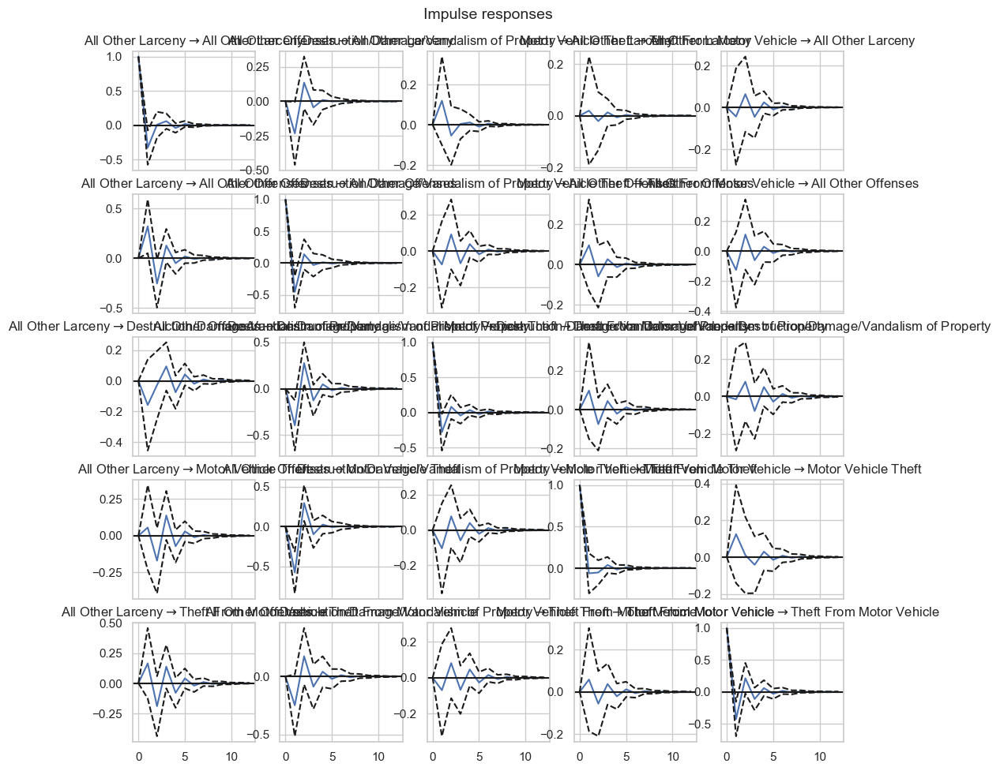

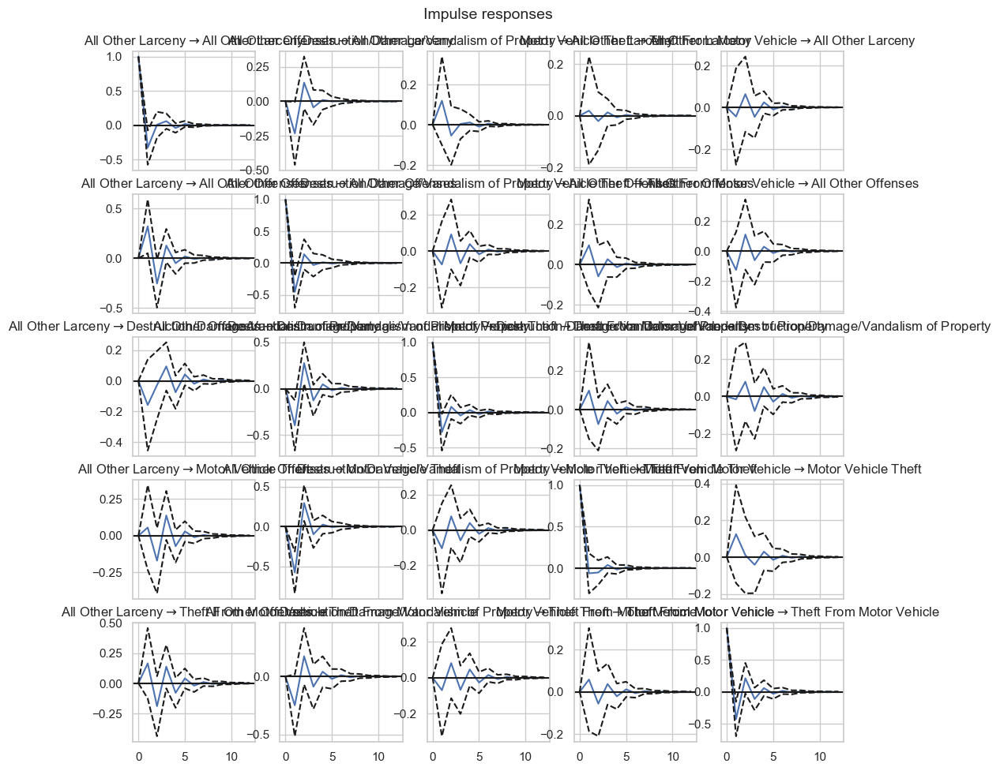

In [193]:
irf = results.irf(12)
irf.plot(orth=False)


In [198]:
#####################which crimes are increasing over time
crime_trends = df.groupby(["Month_Year", "nibrs_code_name"]).size().reset_index(name="count")
crime_trends["Month_Year"] = pd.to_datetime(crime_trends["Month_Year"])


KeyError: 'Month_Year'

In [195]:
from sklearn.linear_model import LinearRegression
import pandas as pd

# Prepare storage
slopes = []

# Loop through each crime type
for crime in crime_trends["nibrs_code_name"].unique():
    subset = crime_trends[crime_trends["nibrs_code_name"] == crime].copy()
    subset = subset.sort_values("Month_Year")

    # Create numeric time index
    subset["time_idx"] = range(len(subset))
    
    # Fit linear regression: count ~ time
    model = LinearRegression()
    model.fit(subset[["time_idx"]], subset["count"])
    
    # Store slope
    slopes.append((crime, model.coef_[0]))

# Create DataFrame of results
trend_df = pd.DataFrame(slopes, columns=["Crime Type", "Trend (slope)"])
trend_df = trend_df.sort_values("Trend (slope)", ascending=False)


In [196]:
import plotly.express as px

top_increasing = trend_df.head(10)
fig = px.bar(top_increasing, x="Trend (slope)", y="Crime Type", orientation="h",
             title="Top 10 Increasing Crimes Over Time (Linear Trend)",
             labels={"Trend (slope)": "Monthly Change (Estimated Slope)"})
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()


In [48]:
####################VAR analysis using the top 4 increasing crime types
from sklearn.linear_model import LinearRegression

# Calculate monthly counts
crime_trends = df.groupby(["Month_Year", "nibrs_code_name"]).size().reset_index(name="count")
crime_trends["Month_Year"] = pd.to_datetime(crime_trends["Month_Year"])

# Fit linear model for each crime type
slopes = []
for crime in crime_trends["nibrs_code_name"].unique():
    subset = crime_trends[crime_trends["nibrs_code_name"] == crime].copy()
    subset = subset.sort_values("Month_Year")
    subset["time_idx"] = range(len(subset))
    
    model = LinearRegression()
    model.fit(subset[["time_idx"]], subset["count"])
    
    slopes.append((crime, model.coef_[0]))

trend_df = pd.DataFrame(slopes, columns=["nibrs_code_name", "slope"])
top_crimes = trend_df.sort_values("slope", ascending=False).head(4)["nibrs_code_name"]


In [49]:
# Filter to top increasing crimes
crime_top = df[df["nibrs_code_name"].isin(top_crimes)]

# Pivot to wide format (Month_Year × Crime Type)
crime_counts = crime_top.groupby(["Month_Year", "nibrs_code_name"]).size().reset_index(name="count")
crime_wide = crime_counts.pivot(index="Month_Year", columns="nibrs_code_name", values="count").fillna(0)
crime_wide.index = pd.to_datetime(crime_wide.index)
crime_wide = crime_wide.sort_index()

# First difference to ensure stationarity
crime_diff = crime_wide.diff().dropna()


In [50]:
from statsmodels.tsa.api import VAR

model = VAR(crime_diff)
results = model.fit(maxlags=4, ic='aic')  # adjust maxlags if necessary
print(results.summary())


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 30, May, 2025
Time:                     06:54:00
--------------------------------------------------------------------
No. of Equations:         4.00000    BIC:                    24.9960
Nobs:                     63.0000    HQIC:                   24.5832
Log likelihood:          -1103.51    FPE:                3.63679e+10
AIC:                      24.3156    Det(Omega_mle):     2.67945e+10
--------------------------------------------------------------------
Results for equation All Other Offenses
                            coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------------
const                         -1.163063         3.856906           -0.302           0.763
L1.All Other Offenses         -0.534382         0.133024           -4.017           0.000
L1.Motor Ve

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



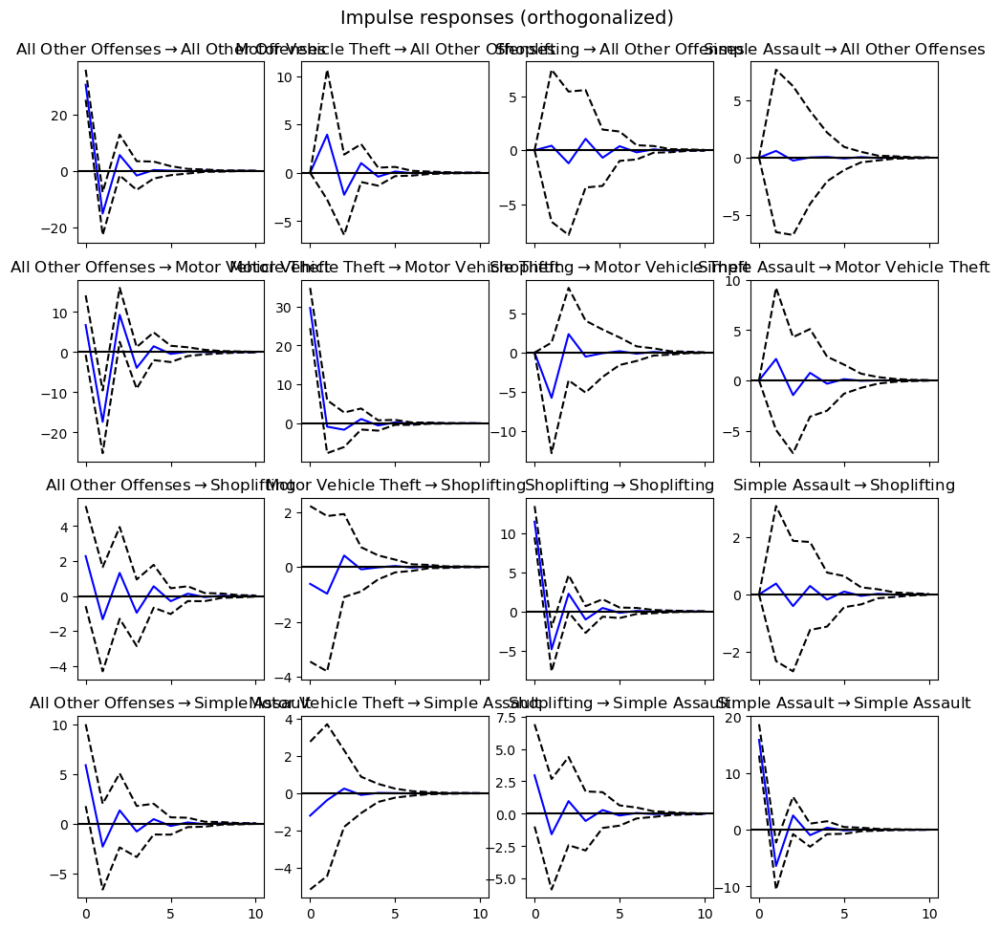

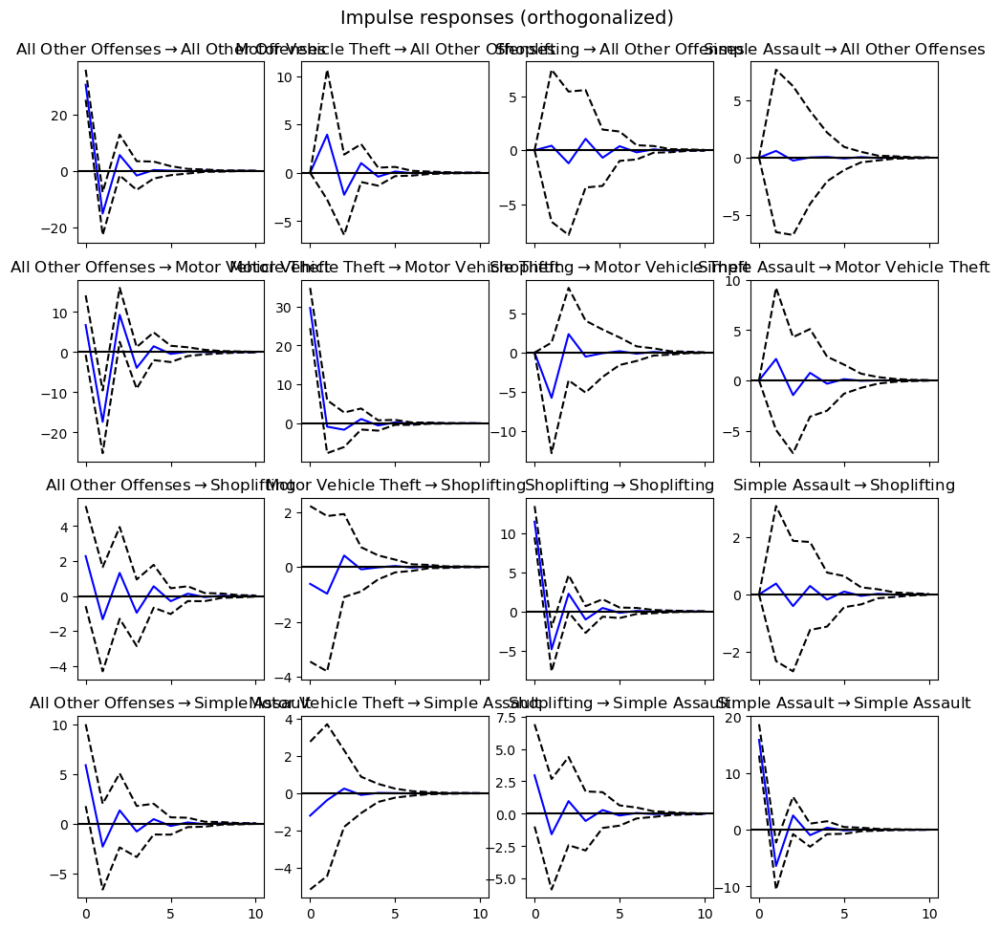

In [51]:
irf = results.irf(10)
irf.plot(orth=True)


In [52]:
forecast = results.forecast(crime_diff.values[-results.k_ar:], steps=6)
forecast_df = pd.DataFrame(forecast, columns=crime_diff.columns)
forecast_df.index = pd.date_range(start=crime_wide.index[-1] + pd.DateOffset(months=1), periods=6, freq="MS")

# Add back to last known value
forecast_cumsum = forecast_df.cumsum() + crime_wide.iloc[-1]


In [55]:
import plotly.graph_objects as go

fig = go.Figure()
for col in forecast_cumsum.columns:
    fig.add_trace(go.Scatter(
        x=forecast_cumsum.index,
        y=forecast_cumsum[col],
        mode='lines+markers',
        name=col
    ))
fig.update_layout(title="6-Month Forecast for Top 4 Increasing Crimes", xaxis_title="Date", yaxis_title="Predicted Count")
fig.show()


In [56]:
#######################################Find Peak Months
df["Month_Year"] = pd.to_datetime(df["Month_Year"])
df["Month"] = df["Month_Year"].dt.month_name()



In [57]:
top_4 = ["All Other Offenses", "Motor Vehicle Theft", "Shoplifting", "Simple Assault"]
df_top = df[df["nibrs_code_name"].isin(top_4)]


In [58]:
monthly_counts = (
    df_top.groupby(["nibrs_code_name", "Month"])
    .size()
    .reset_index(name="count")
)


In [59]:
month_order = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]
monthly_counts["Month"] = pd.Categorical(monthly_counts["Month"], categories=month_order, ordered=True)
monthly_counts = monthly_counts.sort_values(["nibrs_code_name", "Month"])


In [60]:
import plotly.express as px

fig = px.bar(
    monthly_counts,
    x="Month", y="count", color="nibrs_code_name", barmode="group",
    title="Monthly Crime Peaks for Top 4 Increasing Crimes"
)
fig.show()


/Users/selin/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [62]:


# Pivot the data to wide format for heatmap (rows = crimes, columns = months)
heatmap_df = monthly_counts.pivot(index="nibrs_code_name", columns="Month", values="count")
heatmap_df = heatmap_df[[
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]]  # ensure proper order

fig = px.imshow(
    heatmap_df,
    color_continuous_scale="YlOrRd",
    labels={"x": "Month", "y": "Crime Type", "color": "Count"},
    title="📊 Seasonal Heatmap: Monthly Crime Totals by Type"
)
fig.update_xaxes(side="top")
fig.show()


In [64]:


# Ensure month ordering
polar_df = monthly_counts.copy()
polar_df["Month"] = pd.Categorical(polar_df["Month"], categories=month_order, ordered=True)
polar_df = polar_df.sort_values(["nibrs_code_name", "Month"])

# Create polar line plot
fig = px.line_polar(
    polar_df,
    r="count",
    theta="Month",
    color="nibrs_code_name",
    title="🧭 Polar Plot: Seasonal Pattern of Top 4 Increasing Crimes"
)

fig.update_traces(fill='toself')  # optional for filled area
fig.show()



/Users/selin/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [70]:
#######################Weekday vs. Monthly Crime Peaks
df["Month_Year"] = pd.to_datetime(df["Month_Year"])
df["Month"] = df["Month_Year"].dt.month_name()
df["Weekday"] = df["Month_Year"].dt.day_name()
df["incident_datetime"] = pd.to_datetime(df["incident_datetime"], errors="coerce")
df["Hour"] = df["incident_datetime"].dt.hour



In [71]:
top_4 = ["All Other Offenses", "Motor Vehicle Theft", "Shoplifting", "Simple Assault"]
df_top = df[df["nibrs_code_name"].isin(top_4)]


In [72]:
# Monthly totals
monthly_counts = (
    df_top.groupby(["nibrs_code_name", "Month"])
    .size()
    .reset_index(name="count")
)

# Weekday totals
weekday_counts = (
    df_top.groupby(["nibrs_code_name", "Weekday"])
    .size()
    .reset_index(name="count")
)

# Hourly totals
hourly_counts = (
    df_top.groupby(["nibrs_code_name", "Hour"])
    .size()
    .reset_index(name="count")
    .sort_values(["nibrs_code_name", "Hour"])
)


In [68]:
month_order = [
    "January", "February", "March", "April", "May", "June",
    "July", "August", "September", "October", "November", "December"
]
weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

monthly_counts["Month"] = pd.Categorical(monthly_counts["Month"], categories=month_order, ordered=True)
weekday_counts["Weekday"] = pd.Categorical(weekday_counts["Weekday"], categories=weekday_order, ordered=True)

monthly_counts = monthly_counts.sort_values(["nibrs_code_name", "Month"])
weekday_counts = weekday_counts.sort_values(["nibrs_code_name", "Weekday"])


In [174]:


# Monthly bar chart
fig_month = px.bar(
    monthly_counts,
    x="Month", y="count", color="nibrs_code_name",
    title="📅 Monthly Crime Patterns (Top 4 Increasing Crimes)",
    barmode="group"
)

# Weekday bar chart
fig_week = px.bar(
    weekday_counts,
    x="Weekday", y="count", color="nibrs_code_name",
    title="🕒 Weekday Crime Patterns (Top 4 Increasing Crimes)",
    barmode="group"
)


fig_hour = px.line(
    hourly_counts,
    x="Hour", y="count", color="nibrs_code_name",
    title="⏰ Hour-of-Day Crime Patterns (Top 4 Increasing Crimes)",
    labels={"count": "Total Count"},
    markers=True
)
fig.update_layout(xaxis=dict(dtick=1))  # show every hour


fig_month.show()
fig_week.show()
fig_hour.show()


/Users/selin/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/plotly/express/_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [75]:
#################VAR per ZIP Code (Automated)
import pandas as pd
from statsmodels.tsa.api import VAR
from tqdm import tqdm

# Assume df has already been preprocessed with:
# - 'incident_datetime' converted
# - 'Month_Year', 'zip', and 'nibrs_code_name' columns cleaned
df["Month_Year"] = pd.to_datetime(df["incident_datetime"]).dt.to_period("M").astype(str)

# Select target crime types
top_crimes = ["All Other Offenses", "Motor Vehicle Theft", "Shoplifting", "Simple Assault"]

# Filter and pivot
df_zip_month = (
    df[df["nibrs_code_name"].isin(top_crimes)]
    .groupby(["zip", "Month_Year", "nibrs_code_name"])
    .size()
    .reset_index(name="count")
)

pivoted = df_zip_month.pivot_table(index=["Month_Year", "zip"],
                                    columns="nibrs_code_name",
                                    values="count",
                                    fill_value=0).reset_index()


In [79]:
def fit_var_with_irf(zip_code, steps=6, lag_order=1):
    try:
        df_zip = pivoted[pivoted["zip"] == zip_code].copy()
        if df_zip.empty:
            return None

        df_zip.index = pd.to_datetime(df_zip["Month_Year"])
        df_zip = df_zip[top_crimes]

        df_zip = df_zip.loc[:, (df_zip != 0).any(axis=0)]
        if df_zip.shape[1] < 2:
            return None

        model = VAR(df_zip)
        result = model.fit(lag_order)

        # Forecast
        forecast = result.forecast(df_zip.values[-lag_order:], steps=steps)
        forecast_index = pd.date_range(df_zip.index[-1] + pd.offsets.MonthBegin(), periods=steps, freq='MS')
        forecast_df = pd.DataFrame(forecast, columns=df_zip.columns, index=forecast_index)
        forecast_df["zip"] = zip_code

        # Impulse Response Function
        irf = result.irf(steps)
        irf_df = irf.cum_effects  # shape: [steps+1, n_endog, n_endog]

        # Flatten the IRF array
        records = []
        for shock_var_idx, shock_var in enumerate(df_zip.columns):
            for response_var_idx, response_var in enumerate(df_zip.columns):
                for step in range(steps + 1):
                    value = irf_df[step, response_var_idx, shock_var_idx]
                    records.append({
                        "zip": zip_code,
                        "shock_var": shock_var,
                        "response_var": response_var,
                        "step": step,
                        "response": value
                    })

        irf_flat_df = pd.DataFrame.from_records(records)
        return forecast_df.reset_index(names="Month"), irf_flat_df

    except Exception as e:
        print(f"Failed for ZIP {zip_code}: {e}")
        return None, None



In [82]:
forecasts = []
irfs = []

for zip_code in tqdm(all_zips):
    result = fit_var_with_irf(zip_code)
    if result is None:
        continue  # Skip failed ZIPs
    forecast_df, irf_df = result
    if forecast_df is not None:
        forecasts.append(forecast_df)
    if irf_df is not None:
        irfs.append(irf_df)


# Combine results
forecast_all_zips = pd.concat(forecasts, ignore_index=True)
irf_all_zips = pd.concat(irfs, ignore_index=True)



  0%|                                                   | 0/185 [00:00<?, ?it/s]/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index

Failed for ZIP 98026: Matrix is not positive definite


/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no

/var/folders/jf/qg8srjzs7d9bg9npqyhh8x1c0000gn/T/ipykernel_99762/1872418003.py:7: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/var/folders/jf/qg8srjzs7d9bg9npqyhh8x1c0000gn/T/ipykernel_99762/1872418003.py:7: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecast

Failed for ZIP 98119: Matrix is not positive definite
Failed for ZIP 98273: Matrix is not positive definite
Failed for ZIP 98826: x contains one or more constant columns. Column(s) 2 are constant. Adding a constant with trend='c' is not allowed.
Failed for ZIP 98008: Matrix is not positive definite
Failed for ZIP 98925: x contains one or more constant columns. Column(s) 0 are constant. Adding a constant with trend='c' is not allowed.
Failed for ZIP 98012: x contains one or more constant columns. Column(s) 0 are constant. Adding a constant with trend='c' is not allowed.


/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/Users/selin/opt/anaconda3/lib/python3.9/site-packages/stats

Failed for ZIP 98043: Matrix is not positive definite
Failed for ZIP 98117: Matrix is not positive definite
Failed for ZIP 98040: Matrix is not positive definite
Failed for ZIP 98020: x contains one or more constant columns. Column(s) 0 are constant. Adding a constant with trend='c' is not allowed.
Failed for ZIP 98050: Matrix is not positive definite
Failed for ZIP 98321: x contains one or more constant columns. Column(s) 0 are constant. Adding a constant with trend='c' is not allowed.
Failed for ZIP 98579: x contains one or more constant columns. Column(s) 0 are constant. Adding a constant with trend='c' is not allowed.
Failed for ZIP 98271: x contains one or more constant columns. Column(s) 1 are constant. Adding a constant with trend='c' is not allowed.


In [83]:


zip_sample = irf_all_zips["zip"].sample(1).iloc[0]
subset = irf_all_zips[irf_all_zips["zip"] == zip_sample]

fig = px.line(
    subset,
    x="step",
    y="response",
    color="response_var",
    facet_col="shock_var",
    title=f"Impulse Response (Cumulative) for ZIP {zip_sample}",
    labels={"response": "Effect", "step": "Months Ahead"}
)
fig.show()


zip
98001    AxesSubplot(0.125,0.11;0.775x0.77)
98002    AxesSubplot(0.125,0.11;0.775x0.77)
98003    AxesSubplot(0.125,0.11;0.775x0.77)
98004    AxesSubplot(0.125,0.11;0.775x0.77)
98006    AxesSubplot(0.125,0.11;0.775x0.77)
                        ...                
98251    AxesSubplot(0.125,0.11;0.775x0.77)
98288    AxesSubplot(0.125,0.11;0.775x0.77)
98391    AxesSubplot(0.125,0.11;0.775x0.77)
98403    AxesSubplot(0.125,0.11;0.775x0.77)
98424    AxesSubplot(0.125,0.11;0.775x0.77)
Name: All Other Offenses, Length: 81, dtype: object

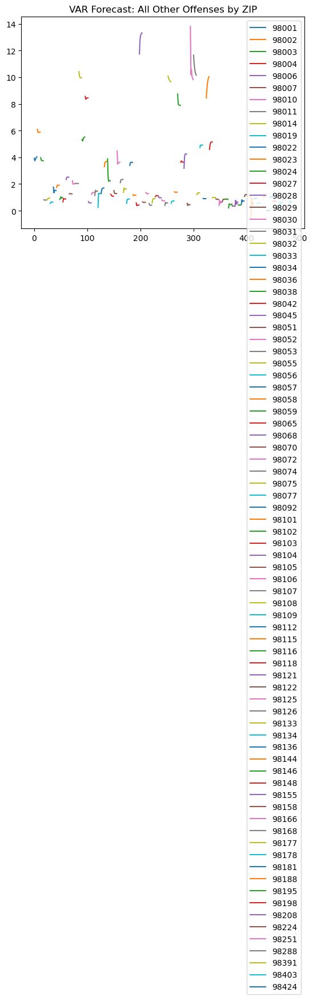

In [84]:
forecast_all_zips.to_csv("forecast_by_zip.csv", index=False)

# Optional: quick check
forecast_all_zips.groupby("zip")["All Other Offenses"].plot(legend=True, title="VAR Forecast: All Other Offenses by ZIP")


In [85]:
#######Rank ZIPs by IRF Strength
# Exclude self-responses
irf_strength_df = (
    irf_all_zips[irf_all_zips["shock_var"] != irf_all_zips["response_var"]]
    .groupby(["zip", "shock_var", "response_var"])
    .agg(total_abs_effect=("response", lambda x: x.abs().sum()))
    .reset_index()
)


In [86]:
zip_ranking = (
    irf_strength_df
    .groupby("zip")["total_abs_effect"]
    .sum()
    .reset_index()
    .sort_values("total_abs_effect", ascending=False)
)

print(zip_ranking.head(10))


      zip  total_abs_effect
44  98104         53.833254
41  98101         31.189194
4   98006         30.007868
77  98288         28.385019
58  98133         26.537213
62  98146         25.661226
65  98158         24.343666
71  98188         22.704255
67  98168         22.238868
33  98065         20.316375


In [87]:


fig = px.bar(
    zip_ranking.head(20),
    x="zip", y="total_abs_effect",
    title="Top 20 ZIP Codes by Total IRF Strength",
    labels={"total_abs_effect": "Cumulative IRF Strength"},
    text_auto=True
)
fig.show()


In [91]:
zip_geo["zip"] = zip_geo["ZCTA5CE20"]
zip_geo_irf = zip_geo.merge(zip_ranking, on="zip", how="left").fillna(0)

fig = px.choropleth_mapbox(
    zip_geo_irf,
    geojson=zip_geo_irf.geometry.__geo_interface__,
    locations=zip_geo_irf.index,
    color="total_abs_effect",
    hover_name="zip",  # Show ZIP code as main hover label
    hover_data={"zip": True, "total_abs_effect": True},
    mapbox_style="carto-positron",
    zoom=7,
    center={"lat": 47.5, "lon": -122.1},
    color_continuous_scale="OrRd",
    title="ZIP-Level IRF Strength (Cumulative Crime Response)"
)

fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()



/var/folders/jf/qg8srjzs7d9bg9npqyhh8x1c0000gn/T/ipykernel_99762/2403122300.py:2: DeprecationWarning:

ExtensionArray.fillna added a 'copy' keyword in pandas 2.1.0. In a future version, ExtensionArray subclasses will need to implement this keyword or an exception will be raised. In the interim, the keyword is ignored by GeometryArray.



In [90]:
top_zips = zip_ranking.head(5)["zip"].tolist()
top_zips


['98104', '98101', '98006', '98288', '98133']

In [92]:
########Rank Crime Pairs by IRF Strength (e.g., Shoplifting → Simple Assault)

##You want to find out which crime shocks (e.g., shoplifting) lead to the strongest cumulative responses 
##in other crimes (e.g., simple assault), and in which ZIPs this interaction is most pronounced.
# Exclude self-responses
pair_strength = (
    irf_all_zips[irf_all_zips["shock_var"] != irf_all_zips["response_var"]]
    .groupby(["shock_var", "response_var"])
    .agg(total_abs_effect=("response", lambda x: x.abs().sum()))
    .reset_index()
    .sort_values("total_abs_effect", ascending=False)
)

print(pair_strength.head(10))


              shock_var         response_var  total_abs_effect
3   Motor Vehicle Theft   All Other Offenses        125.767007
9        Simple Assault   All Other Offenses        113.013782
8           Shoplifting       Simple Assault        103.430980
7           Shoplifting  Motor Vehicle Theft        100.167178
0    All Other Offenses  Motor Vehicle Theft         81.058241
5   Motor Vehicle Theft       Simple Assault         79.651376
6           Shoplifting   All Other Offenses         77.606584
2    All Other Offenses       Simple Assault         71.702759
10       Simple Assault  Motor Vehicle Theft         71.472536
11       Simple Assault          Shoplifting         41.703291


In [93]:
zip_pair_strength = (
    irf_all_zips[
        (irf_all_zips["shock_var"] == "Shoplifting") &
        (irf_all_zips["response_var"] == "Simple Assault")
    ]
    .groupby("zip")
    .agg(pair_effect=("response", lambda x: x.abs().sum()))
    .reset_index()
    .sort_values("pair_effect", ascending=False)
)

print(zip_pair_strength.head(10))


      zip  pair_effect
17  98065     9.468632
41  98288     7.546594
29  98134     6.940869
26  98109     6.527077
14  98056     5.271555
20  98074     5.143092
23  98101     4.803190
39  98188     4.498894
30  98136     3.380640
24  98106     3.294598


In [94]:
zip_geo_pair = zip_geo.merge(zip_pair_strength, on="zip", how="left").fillna(0)

fig = px.choropleth_mapbox(
    zip_geo_pair,
    geojson=zip_geo_pair.geometry.__geo_interface__,
    locations=zip_geo_pair.index,
    color="pair_effect",
    hover_name="zip",
    hover_data={"zip": True, "pair_effect": True},
    mapbox_style="carto-positron",
    zoom=7, center={"lat": 47.5, "lon": -122.1},
    color_continuous_scale="YlGnBu",
    title="Shoplifting → Simple Assault: IRF by ZIP"
)
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


/var/folders/jf/qg8srjzs7d9bg9npqyhh8x1c0000gn/T/ipykernel_99762/300279759.py:1: DeprecationWarning:

ExtensionArray.fillna added a 'copy' keyword in pandas 2.1.0. In a future version, ExtensionArray subclasses will need to implement this keyword or an exception will be raised. In the interim, the keyword is ignored by GeometryArray.



In [108]:
#####Cluster ZIPs Using IRF Patterns
#Clustering ZIP codes based on IRF patterns is a 
#great way to uncover systemic crime dynamics and group areas that exhibit similar inter-crime responses. 
# Exclude self-responses
# Pivot: each row is a ZIP, each column is a (shock → response) pair
zip_matrix = (
    irf_all_zips
    .assign(pair=lambda d: d["shock_var"] + " → " + d["response_var"])
    .pivot_table(index="zip", columns="pair", values="response", aggfunc="sum")
    .fillna(0)
)



In [109]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
zip_matrix_scaled = scaler.fit_transform(zip_matrix)


In [110]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)  # Adjust clusters as needed
zip_clusters = pd.DataFrame({
    "zip": zip_matrix.index,
    "cluster": kmeans.fit_predict(zip_matrix_scaled)
})


In [111]:
zip_geo["zip"] = zip_geo["zip"].astype(str)
zip_clusters["zip"] = zip_clusters["zip"].astype(str)


In [130]:
zip_geo_clustered = zip_geo.merge(zip_clusters, on="zip", how="left")



fig = px.choropleth_mapbox(
    zip_geo_clustered,
    geojson=zip_geo_clustered.geometry.__geo_interface__,
    locations=zip_geo_clustered.index,
    color="cluster",
    hover_name="zip",
    mapbox_style="carto-positron",
    center={"lat": 47.5, "lon": -122.1},
    zoom=7,
    color_continuous_scale=px.colors.qualitative.Set1,
    title="ZIP Clusters Based on IRF Patterns"
)
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()


In [113]:
#### descriptives for clusters
# Ensure consistent types
zip_clusters["zip"] = zip_clusters["zip"].astype(str)
irf_all_zips["zip"] = irf_all_zips["zip"].astype(str)

# Merge cluster info
irf_clustered = irf_all_zips.merge(zip_clusters, on="zip", how="left")


In [114]:
# Compute total IRF strength (absolute cumulative) per cluster
cluster_stats = (
    irf_clustered
    .groupby(["cluster", "shock_var", "response_var"])
    .agg(total_abs_effect=("response", lambda x: x.abs().sum()))
    .reset_index()
    .sort_values(["cluster", "total_abs_effect"], ascending=[True, False])
)


In [115]:
for cluster_id in sorted(cluster_stats["cluster"].unique()):
    print(f"\n🔹 Cluster {cluster_id} – Top Crime Pair Effects:")
    display(cluster_stats[cluster_stats["cluster"] == cluster_id].head(5))



🔹 Cluster 0 – Top Crime Pair Effects:


,cluster,shock_var,response_var,total_abs_effect
5,0,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
10,0,Shoplifting,Shoplifting,215.361373
15,0,Simple Assault,Simple Assault,210.132784
0,0,All Other Offenses,All Other Offenses,206.732551
9,0,Shoplifting,Motor Vehicle Theft,71.199863



🔹 Cluster 1 – Top Crime Pair Effects:


,cluster,shock_var,response_var,total_abs_effect
31,1,Simple Assault,Simple Assault,78.673005
16,1,All Other Offenses,All Other Offenses,32.608803
21,1,Motor Vehicle Theft,Motor Vehicle Theft,30.210790
19,1,All Other Offenses,Simple Assault,19.946778
28,1,Simple Assault,All Other Offenses,15.716912



🔹 Cluster 2 – Top Crime Pair Effects:


,cluster,shock_var,response_var,total_abs_effect
46,2,Simple Assault,Shoplifting,9.682748
32,2,All Other Offenses,All Other Offenses,8.547557
34,2,All Other Offenses,Shoplifting,7.469866
37,2,Motor Vehicle Theft,Motor Vehicle Theft,7.058133
47,2,Simple Assault,Simple Assault,6.249908



🔹 Cluster 3 – Top Crime Pair Effects:


,cluster,shock_var,response_var,total_abs_effect
48,3,All Other Offenses,All Other Offenses,335.860689
63,3,Simple Assault,Simple Assault,296.336527
53,3,Motor Vehicle Theft,Motor Vehicle Theft,269.260105
58,3,Shoplifting,Shoplifting,113.879491
60,3,Simple Assault,All Other Offenses,56.033235


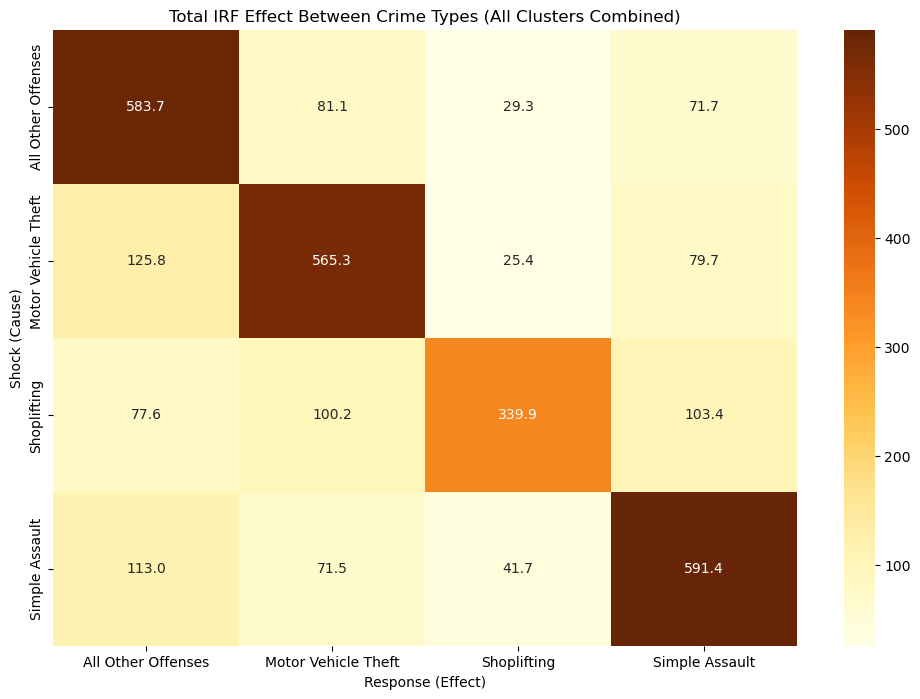

In [116]:
cluster_pivot = (
    cluster_stats
    .pivot_table(index="shock_var", columns="response_var", values="total_abs_effect", aggfunc="sum")
    .fillna(0)
)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(cluster_pivot, annot=True, fmt=".1f", cmap="YlOrBr")
plt.title("Total IRF Effect Between Crime Types (All Clusters Combined)")
plt.ylabel("Shock (Cause)")
plt.xlabel("Response (Effect)")
plt.show()


In [122]:
from census import Census
from us import states


c = Census("65bf25bf3453c5082056d994b57d0decbcb68c96")  # Your API key

# Your list of ZIPs (already cleaned)
zips = zip_geo_cluster["zip"].astype(str).unique().tolist()

# Define variables to fetch
# B01003_001E = total population
# B19013_001E = median household income
# B17001_002E = population below poverty
fields = ['NAME', 'B01003_001E', 'B19013_001E', 'B17001_002E']

# Get all ZCTA-level data (not by individual ZIP)
zcta_data = c.acs5.get(fields, geo={'for': 'zip code tabulation area:*'})

In [123]:
df_zcta = pd.DataFrame(zcta_data)

# Rename and clean up
df_zcta = df_zcta.rename(columns={
    'zip code tabulation area': 'zip',
    'B01003_001E': 'total_pop',
    'B19013_001E': 'median_income',
    'B17001_002E': 'pop_below_poverty'
})

df_zcta['zip'] = df_zcta['zip'].astype(str).str.zfill(5)
df_zcta['total_pop'] = pd.to_numeric(df_zcta['total_pop'], errors='coerce')
df_zcta['median_income'] = pd.to_numeric(df_zcta['median_income'], errors='coerce')
df_zcta['pop_below_poverty'] = pd.to_numeric(df_zcta['pop_below_poverty'], errors='coerce')
df_zcta['poverty_rate'] = df_zcta['pop_below_poverty'] / df_zcta['total_pop']


In [124]:
# Ensure both use string ZIPs
zip_clusters["zip"] = zip_clusters["zip"].astype(str).str.zfill(5)

# Merge
zip_cluster_demo = pd.merge(zip_clusters, df_zcta, on="zip", how="left")


In [125]:
summary_stats = zip_cluster_demo.groupby("cluster").agg({
    "total_pop": ["mean", "median"],
    "median_income": ["mean", "median"],
    "poverty_rate": ["mean", "median"],
    "zip": "count"
}).rename(columns={"zip": "n_zips"})

summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns.values]
summary_stats.reset_index(inplace=True)
summary_stats


,cluster,total_pop_mean,total_pop_median,median_income_mean,median_income_median,poverty_rate_mean,poverty_rate_median,n_zips_count
0,0,27576.185185,27573.0,-2.458121e+07,106611.0,0.100058,0.082821,27
1,1,28555.571429,28170.0,9.773800e+04,94548.0,0.109648,0.100000,7
2,2,39753.000000,39753.0,1.859910e+05,185991.0,0.073529,0.073529,1
3,3,28850.933333,25827.0,-1.469850e+07,112735.0,0.073288,0.077910,46


In [126]:


fig = px.bar(
    zip_cluster_demo.groupby("cluster")["median_income"].median().reset_index(),
    x="cluster", y="median_income",
    title="Median Household Income by ZIP Cluster",
    labels={"median_income": "Median Income ($)", "cluster": "Cluster"},
    text_auto=True
)
fig.show()


In [127]:
fig = px.box(
    zip_cluster_demo,
    x="cluster", y="poverty_rate",
    title="Poverty Rate Distribution by ZIP Cluster",
    labels={"poverty_rate": "Poverty Rate", "cluster": "Cluster"}
)
fig.show()


In [134]:
 zip_cluster_demo

,zip,cluster,NAME,total_pop,median_income,pop_below_poverty,poverty_rate
0,98001,0,ZCTA5 98001,35842.0,103338.0,2950.0,0.082306
1,98002,3,ZCTA5 98002,36812.0,68040.0,3883.0,0.105482
2,98003,3,ZCTA5 98003,51329.0,67547.0,7452.0,0.145181
3,98004,3,ZCTA5 98004,39161.0,157784.0,2052.0,0.052399
4,98006,2,ZCTA5 98006,39753.0,185991.0,2923.0,0.073529
...,...,...,...,...,...,...,...
76,98251,3,ZCTA5 98251,4703.0,71175.0,488.0,0.103764
77,98288,1,ZCTA5 98288,180.0,55833.0,27.0,0.150000
78,98391,3,ZCTA5 98391,56646.0,122822.0,1922.0,0.033930
79,98403,3,ZCTA5 98403,8613.0,81330.0,795.0,0.092302


In [135]:
cluster_stats

,cluster,shock_var,response_var,total_abs_effect
5,0,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
10,0,Shoplifting,Shoplifting,215.361373
15,0,Simple Assault,Simple Assault,210.132784
0,0,All Other Offenses,All Other Offenses,206.732551
9,0,Shoplifting,Motor Vehicle Theft,71.199863
...,...,...,...,...
57,3,Shoplifting,Motor Vehicle Theft,28.455118
56,3,Shoplifting,All Other Offenses,27.145489
62,3,Simple Assault,Shoplifting,9.272072
50,3,All Other Offenses,Shoplifting,5.684685


In [137]:

import numpy as np

# Step 1: Get the top shock-response pair per cluster (i.e., max IRF effect per cluster)
top_pairs = (
    cluster_stats
    .sort_values("total_abs_effect", ascending=False)
    .groupby("cluster")
    .first()
    .reset_index()
)

# Step 2: Merge top_pairs with ZIP-level data by 'cluster'
merged = pd.merge(zip_cluster_demo, top_pairs, on="cluster", how="left")

# Step 3: Format the final scorecard
scorecards = merged[[
    "zip", "cluster", "total_pop", "median_income", "pop_below_poverty", "poverty_rate",
    "shock_var", "response_var", "total_abs_effect"
]].rename(columns={
    "shock_var": "top_shock_var",
    "response_var": "top_response_var"
}).sort_values(["cluster", "total_abs_effect"], ascending=[True, False])


import IPython.display as display
display.display(scorecards)


,zip,cluster,total_pop,median_income,pop_below_poverty,poverty_rate,top_shock_var,top_response_var,total_abs_effect
0,98001,0,35842.0,103338.0,2950.0,0.082306,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
7,98011,0,27573.0,124418.0,1140.0,0.041345,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
8,98014,0,7626.0,149028.0,277.0,0.036323,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
14,98028,0,23611.0,132191.0,1498.0,0.063445,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
15,98029,0,31227.0,156427.0,1981.0,0.063439,Motor Vehicle Theft,Motor Vehicle Theft,258.753098
...,...,...,...,...,...,...,...,...,...
74,98208,3,60723.0,98805.0,5221.0,0.085981,All Other Offenses,All Other Offenses,335.860689
76,98251,3,4703.0,71175.0,488.0,0.103764,All Other Offenses,All Other Offenses,335.860689
78,98391,3,56646.0,122822.0,1922.0,0.033930,All Other Offenses,All Other Offenses,335.860689
79,98403,3,8613.0,81330.0,795.0,0.092302,All Other Offenses,All Other Offenses,335.860689
